<a href="https://colab.research.google.com/github/adadiorio/Vision_and_cognitive_systems/blob/main/Logo_Contest_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

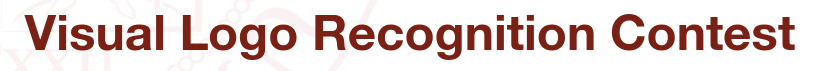

VISION AND COGNITIVE SYSTEMS A.Y. 2022/2023

The aim of the contest is to retrieve the most similar images representing logos of famous companies from a database set containing 110 images. We will consider 4 query images and use the SIFT algorithm. Model performance will be evaluated using average precision (AP) and mean average precision (mAP) metrics.
You can modify the baseline (parameters, feature matching technique, ...) and then submit your results.

- [Submit results](https://forms.gle/mNjZNVjuDuDkffBB6)
- [Visualize Submissions](https://bit.ly/3EZbYSn)

## Aim:
The aim of the contest is to try different features and characteristics.

- Check and try different parameters for the SIFT detector;

*Which kind of parameters are available for the SIFT detector?*

SIFT stands for Scale-Invariant-Feature Transform, it is an algorithm able of detecting edges and features in an image.

Here we will present all the **different parameters** that can be changed after defining a cv2.SIFT_create() object:

1. Threshold, i.e. the number of matches;
2. nfeatures; number of best features to retain;
3. nOctaveLayers: number of layers in each octave. It is computed automatically from the image resolution;
4. contrastThreshold: used to filter out weak features in semi-uniform (low contrast) regions. The larger the threshold, the less features are produced by the detector;
5. edgeThreshold: it is used to filter out edge-like features. In this case, the larger the threshold, the less features are filtered out.
6. sigma: it is the sigma of the gaussian applied to the input image at the octave #0.

- Try different local features (e.g. SURF, ORB, ...) or different combinations of detectors + descriptors

Which kind of local features can be modified?

- SURF (Speeded Up Robust Features): it is faster than SIFT and is able of handle brightness changed;
- ORB (Orientated FAST and Rotated BRIEF): alternative to SIFT and SURF, scale and rotation invariant;
- BRIEF (Binary RObust Independent Elementary Features): rapid descriptor, rotation invariant.

In [ ]:
%%capture
# Update OpenCV package

!pip install -U opencv-python
!pip install opencv-contrib-python

In [1]:
## Upload the zip folders (query.zip and database.zip)
#%%capture
#!unzip query.zip
#!unzip database.zip
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


# List of query/database images
query_images = []
db_images = []
logo_names = []

# Resize images
img_size = (400, 400)

# Read query images
# Order by name
query_path = '/content/drive/My Drive/Logo_context/query'
query_dir = sorted(os.listdir(query_path))
for idx, img_name in enumerate(query_dir):
  # Read image
  img = cv2.imread(os.path.join(query_path, img_name))
  # Resize image
  img = cv2.resize(img, dsize=img_size)
  # Save image
  query_images.append(img)
  # Save logo names (remove "_logo.txt" and capitalize)
  logo_names.append(os.path.splitext(img_name)[0][:-5].capitalize())
  #print("Image '" + img_name + "' loaded.")
print("Query images loaded!")

# Read db images
# Order by number
db_path = '/content/drive/My Drive/Logo_context/database'

db_dir = sorted(os.listdir(db_path), key=lambda x: int(x.split('.')[0]))
for idx, img_name in enumerate(db_dir):
  # Read image
  img = cv2.imread(os.path.join(db_path, img_name))
  # Resize image
  img = cv2.resize(img, dsize=img_size)
  # Save image
  db_images.append(img)
  #print("Image '" + img_name + "' loaded.")
print("Database images loaded!")

Query images loaded!
Database images loaded!


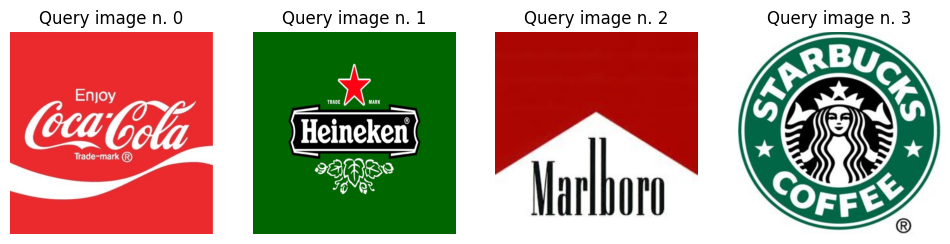

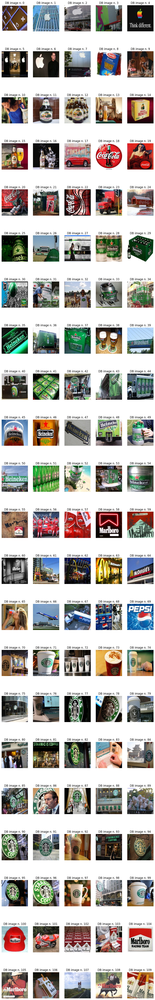

In [3]:
# Plot query images
fig = plt.figure(figsize=(12,12))
for i in range(len(query_images)):
  _ = plt.subplot(1, len(query_images), i+1), plt.title("Query image n. " + str(i))
  plt.imshow(cv2.cvtColor(query_images[i], cv2.COLOR_BGR2RGB)), plt.axis('off')

# Plot database images
fig = plt.figure(figsize=(12, 80))
for i in range(len(db_images)):
  _ = plt.subplot(int(len(db_images)/5), 5, i+1), plt.title("DB image n. " + str(i))
  plt.imshow(cv2.cvtColor(db_images[i], cv2.COLOR_BGR2RGB)), plt.axis('off')

In [4]:
# # Ground-truth arrays per logo
coca_cola_GT = np.zeros(len(db_images))
marlboro_GT = np.zeros(len(db_images))
starbucks_GT = np.zeros(len(db_images))
heineken_GT = np.zeros(len(db_images))

coca_cola_GT[18:25] = 1
marlboro_GT[55:61] = 1
marlboro_GT[100:] = 1
starbucks_GT[70:100] = 1
heineken_GT[25:55] = 1

# Matrix containing ground-truth values for each query image
GT_matrix = np.vstack([coca_cola_GT, heineken_GT, marlboro_GT, starbucks_GT])
print(f"GT matrix shape: {GT_matrix.shape}")

n_coca_cola = int(coca_cola_GT.sum())
n_heineken = int(heineken_GT.sum())
n_marlboro = int(marlboro_GT.sum())
n_starbucks = int(starbucks_GT.sum())
n_others = len(db_images) - (n_coca_cola + n_heineken + n_marlboro + n_starbucks)
print(f"Number of database images (coca_cola): {n_coca_cola}")
print(f"Number of database images (heineken): {n_heineken}")
print(f"Number of database images (marlboro): {n_marlboro}")
print(f"Number of database images (starbucks): {n_starbucks}")
print(f"Number of database images (others): {n_others}")
# print(GT_matrix)

GT matrix shape: (4, 110)
Number of database images (coca_cola): 7
Number of database images (heineken): 30
Number of database images (marlboro): 16
Number of database images (starbucks): 30
Number of database images (others): 27


SIFT algorithm (default parameters)

In [18]:
def get_keypoints():
  '''
  This function can be used in order to modify the detector used to detect the keypoint, i.e edges, of images
  modifying the SIFT object
  Also we can modify some of the hyperparameters
  '''
  # Define SIFT detector object
  detector = cv2.SIFT_create()

  # Detect and compute interest points and their descriptors
  query_kps = []
  query_des = []
  db_kps = []
  db_des = []

  for i in range(len(query_images)):
    kp, des = detector.detectAndCompute(query_images[i], None)
    query_kps.append(kp)
    query_des.append(des)

  for i in range(len(db_images)):
    kp, des = detector.detectAndCompute(db_images[i], None)
    db_kps.append(kp)
    db_des.append(des)

  return query_kps, query_des, db_kps, db_des

query_kps, query_des, db_kps, db_des = get_keypoints()

Ratio test

In [21]:
def get_matches(ratio_thresh = 0.66, flag = 1):
  # Brute-force matcher
  bf = cv2.BFMatcher_create(cv2.NORM_L2)

  # Matrix containing the number of matches per logo
  num_matches = np.zeros((len(query_images), len(db_images)))

  # Filter matches using the Lowe's ratio test
  # ratio_thresh = 0.66

  # Save  matches for each descriptor of query images
  logo_matches = [] # List of lists

  # For each query image
  for q in range(len(query_images)):
    q_matches = []
    # For each database image
    for db in range(len(db_images)):
      matches = bf.knnMatch(query_des[q], db_des[db], k=2)
      # Apply ratio test
      n_matches = 0
      sel_matches = []
      for m,n in matches:
        if m.distance < ratio_thresh * n.distance:
          n_matches += 1
          sel_matches.append(m)
      # Save number of matches
      num_matches[q, db] = n_matches
      # Save matches
      q_matches.append(sel_matches)
    logo_matches.append(q_matches)

  for idx, logo in enumerate(logo_names):
    print("Number of matches (" + logo + "):")
    print(num_matches[idx])


  if flag == 1:
    return logo_matches, num_matches

get_matches(flag = False)

Number of matches (Cocacola):
[ 4.  1.  0.  5.  2.  4.  2.  2.  8.  3.  1.  1.  2.  3.  2.  1.  3.  3.
 24. 30.  7.  2.  3.  4. 11.  2.  0.  2.  4.  3.  5.  0.  2.  1.  3.  2.
  1.  3.  0.  2.  4.  3.  2.  1.  1.  3.  7.  2.  1.  1.  3.  1.  1.  2.
  2.  5.  4.  3.  1.  0.  1.  2.  4.  0.  1.  1.  3.  3.  3.  2.  1.  2.
  2.  5.  2.  0.  0.  1.  1.  2.  4.  0.  0.  2.  1.  1.  0.  0.  1.  1.
  1.  3.  5.  6.  2.  4.  1.  3.  1.  0.  0.  2.  6.  0.  4.  2.  3.  0.
  2.  3.]
Number of matches (Heineken):
[  4.   0.   1.   1.   2.   0.   2.   2.   9.   1.   1.   0.   2.   0.
   0.   1.   0.   1.   0.   2.   0.   0.   1.   0.   8.  27.  20.   1.
 119.  34.   4.  28.   0.  19.   0.  25.   1.  28.   9.  19.   6.  13.
  14.   0.   0.  50.  43.   5.  67.  27.  46.   1.   7.  55.  24.   0.
   3.   1.   8.   1.   1.   5.   7.   3.   0.   0.   0.   0.   5.   2.
   1.   0.   1.   0.   2.   0.   0.   0.   6.   1.   0.   0.   0.   0.
   1.   0.   0.   0.   1.   0.   1.   0.   0.   2.   0.   0.   0. 

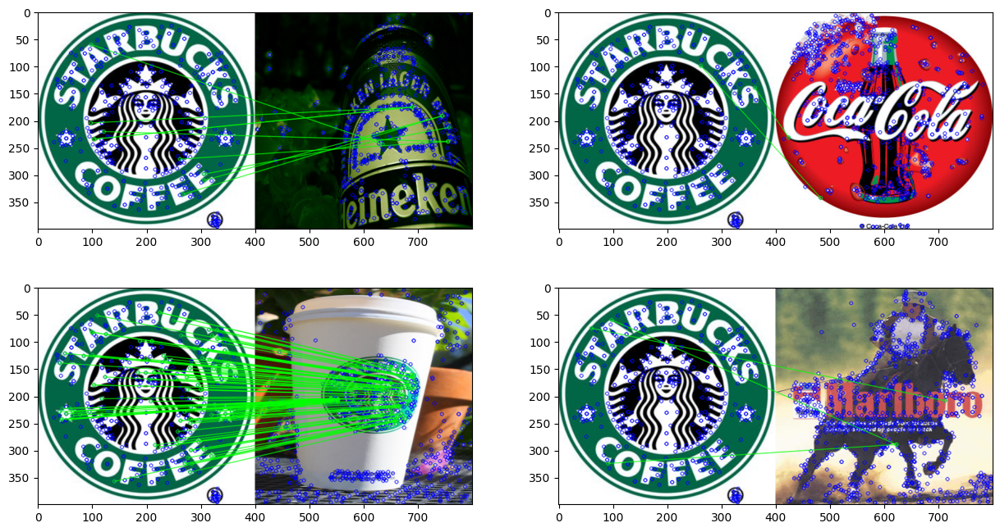

In [14]:
def draw_matches(query_kps, db_kps, logo_matches):
  # Draw some matches
  _  = plt.figure(figsize=(15, 8))
  draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
  plt_list = [25, 18, 71, 108]
  for idx, n in enumerate(plt_list):
    img_matches = cv2.drawMatches(query_images[3], query_kps[3], db_images[n], db_kps[n], logo_matches[3][n], None, **draw_params)
    _ = plt.subplot(2, 2, idx+1), plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))

  plt.show()

draw_matches(query_kps, db_kps, logo_matches)


# **Performance Evaluation**

The performance of the model will be evaluated in terms of precision, recall and average precision.

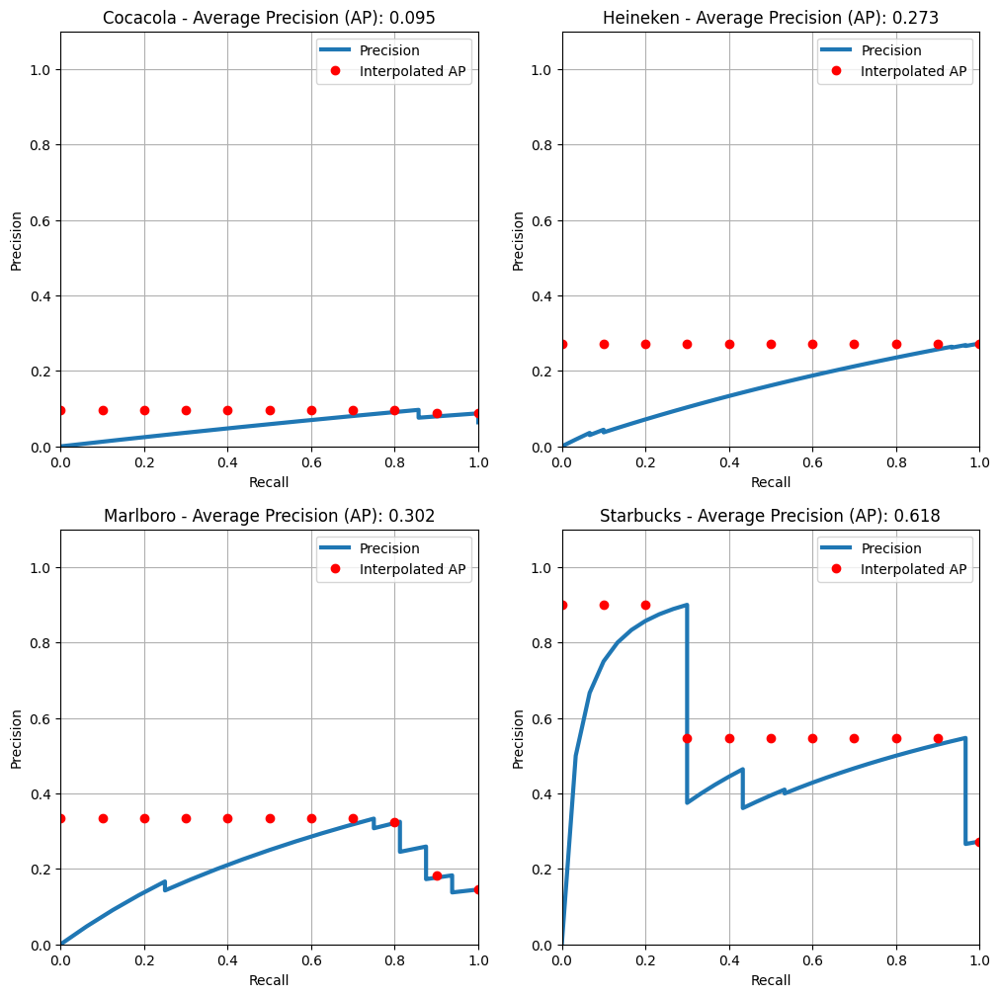

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.095
Heineken   ===>  0.273
Marlboro   ===>  0.302
Starbucks  ===>  0.618

Mean Average Precision (mAP) ===> 0.322


array([0.09508798, 0.27272727, 0.30182255, 0.6184469 ])

In [26]:
# Average precision for each logo

def get_graphs(num_matches):
  AP_all = np.zeros(len(query_images))

  _ = plt.figure(figsize=(12, 12))
  for i in range(len(query_images)):
    # Rank images in descending order according to the number of detected matches
    idx = np.argsort(-num_matches[i])

    # True Positives
    TP = GT_matrix[i, idx] == 1

    # False Positives
    FP = GT_matrix[i, idx] == 0

    # TP and FP for each k
    TP = np.cumsum(TP)
    FP = np.cumsum(FP)

    # Precision/Recall for each k
    prec = TP / (TP + FP);
    rec = TP / np.sum(GT_matrix[i]);

    # (Interpolated) Average precision (as in Pascal VOC2008)
    AP = 0;
    interp_prec = []
    # We evaluate the precision at 11 recall values to reduce ''wiggles'' in the precision/recall curve
    for t in np.linspace(0, 1, num=11):
      p = prec[rec >= t]
      if p.size == 0:
         p = 0
      else:
         p = p.max()
      interp_prec.append(p)
      AP = AP + p/11
      AP_all[i] = AP

    # Plot precision/recall
    _ = plt.subplot(2, 2, i+1)
    plt.title(f"{logo_names[i]} - Average Precision (AP): {AP:.3f}")
    _ = plt.plot(rec, prec, '-', linewidth=3)
    _ = plt.plot(np.linspace(0, 1, num=11), interp_prec, 'o', color='red', linewidth=2)
    plt.legend(['Precision', 'Interpolated AP'])
    plt.grid('on')
    plt.xlabel('Recall'), plt.ylabel('Precision')
    plt.axis((0,1,0,1.1))
  plt.show()

  # Print results
  print('BASELINE RESULTS')
  print("Average Precision (AP):\n")
  for i in range(len(query_images)):
    print(f'{logo_names[i]:9s}  ===>' + ' ' * 2 + f'{AP_all[i]:.3f}')

  print(f"\nMean Average Precision (mAP) ===> {np.mean(AP_all):.3f}")

  return AP_all

get_graphs(num_matches)

## Threshold tuning

In this section we are going to use different values for the threshold, in order to understand which is the one that can actually improve the performances of our algorithm.

----------------------------------------------------------------------
Threshold: 0.50
Number of matches (Cocacola):
[ 0.  0.  0.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  0.  0.  0.  0.
  7. 17.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  0.  0.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  3.  1.  0.  0.  0.  0.  0.  0.
  0.  5.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  1.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  0.  0.  2.  0.  0.  0.  1.  0.  0.  0.  0.  0.
  0.  1.  2.  1.  0.  0.  0.  1.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.
  0.  1.]
Number of matches (Heineken):
[ 2.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0. 15.  7.  0. 68.  6.  1.  5.  0.  4.  0.  6.
  0.  3.  1.  3.  2.  2.  8.  0.  0. 24. 11.  2. 27.  2. 37.  0.  2. 24.
  3.  0.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

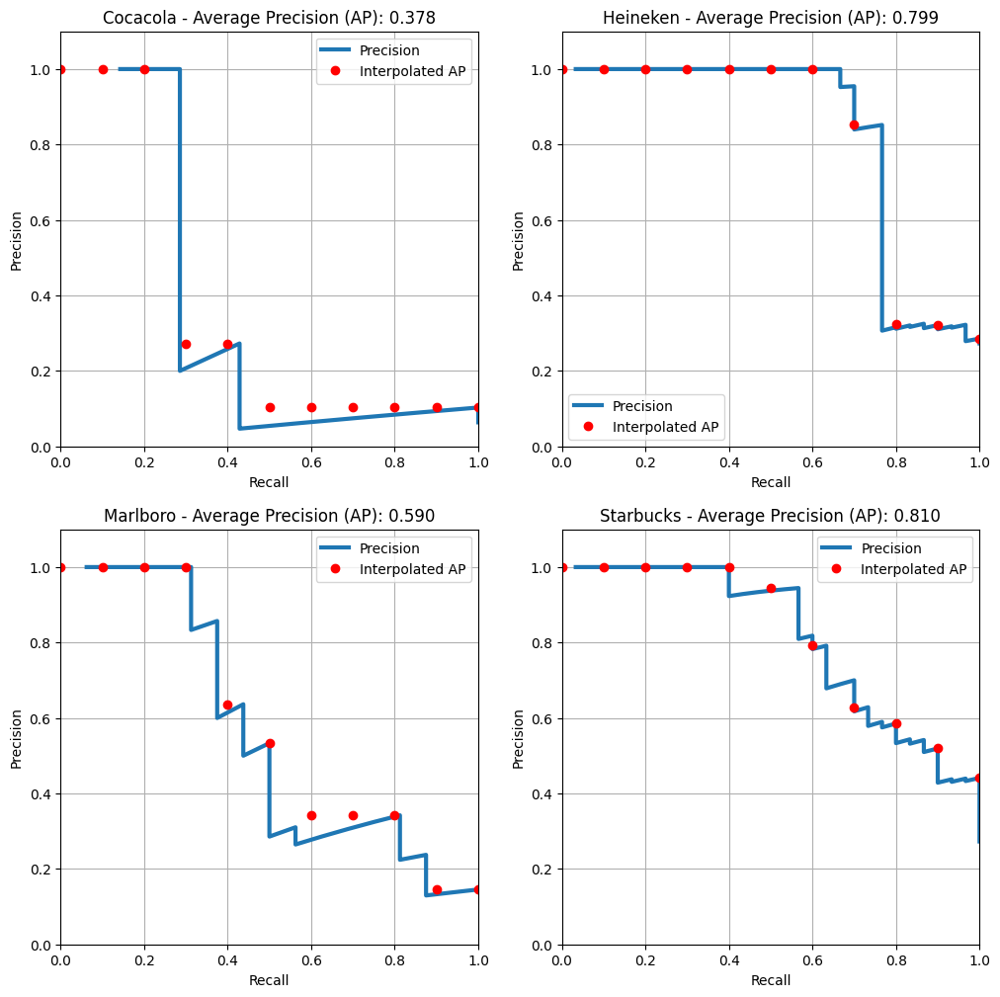

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.378
Heineken   ===>  0.799
Marlboro   ===>  0.590
Starbucks  ===>  0.810

Mean Average Precision (mAP) ===> 0.644
----------------------------------------------------------------------
Threshold: 0.56
Number of matches (Cocacola):
[ 0.  0.  0.  5.  0.  1.  0.  0.  0.  0.  0.  0.  0.  2.  1.  0.  1.  0.
 13. 22.  1.  0.  0.  0.  2.  0.  0.  0.  1.  0.  2.  0.  1.  0.  0.  0.
  0.  1.  0.  2.  1.  0.  0.  0.  0.  1.  4.  1.  1.  0.  0.  0.  0.  1.
  1.  5.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  1.  0.  1.  1.  1.  0.
  0.  3.  1.  0.  0.  0.  0.  0.  2.  0.  0.  1.  1.  0.  0.  0.  0.  1.
  0.  2.  3.  2.  0.  0.  0.  1.  0.  0.  0.  0.  4.  0.  1.  0.  0.  0.
  0.  2.]
Number of matches (Heineken):
[ 3.  0.  0.  0.  0.  0.  1.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0. 19. 15.  0. 81. 10.  2. 10.  0.  5.  0. 11.
  0.  8.  2.  9.  3.  4.  9.  0.  0. 34. 24.  2. 38.  8. 42.  0.  2. 28.
  6.  0.  3

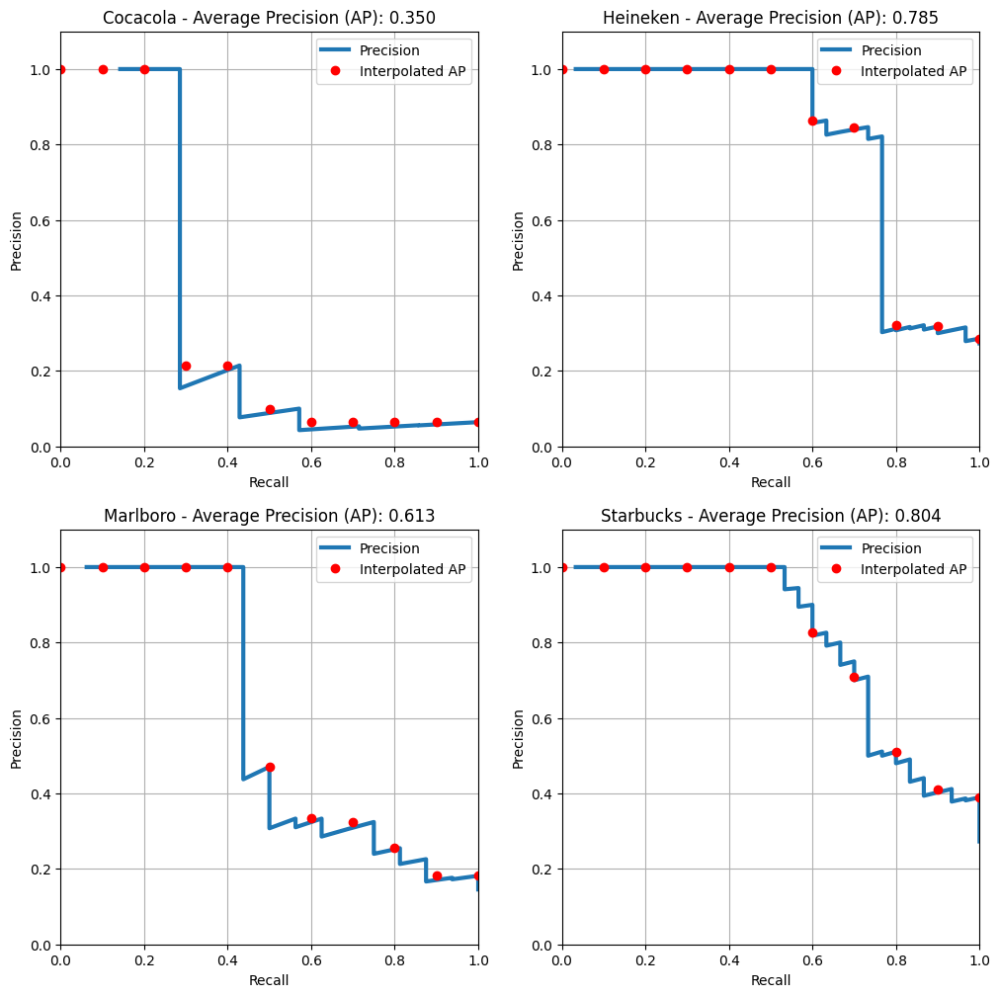

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.350
Heineken   ===>  0.785
Marlboro   ===>  0.613
Starbucks  ===>  0.804

Mean Average Precision (mAP) ===> 0.638
----------------------------------------------------------------------
Threshold: 0.61
Number of matches (Cocacola):
[ 3.  0.  0.  5.  2.  4.  1.  1.  4.  1.  0.  1.  1.  3.  1.  0.  2.  0.
 19. 27.  3.  2.  2.  1.  4.  0.  0.  2.  2.  0.  4.  0.  1.  0.  0.  2.
  0.  3.  0.  2.  2.  2.  1.  0.  1.  3.  5.  1.  1.  1.  1.  0.  0.  1.
  1.  5.  2.  2.  0.  0.  0.  1.  3.  0.  1.  1.  2.  1.  3.  2.  1.  0.
  1.  5.  2.  0.  0.  1.  0.  1.  3.  0.  0.  1.  1.  1.  0.  0.  0.  1.
  0.  3.  3.  3.  0.  2.  1.  1.  0.  0.  0.  0.  5.  0.  1.  0.  0.  0.
  1.  3.]
Number of matches (Heineken):
[  3.   0.   0.   0.   2.   0.   2.   2.   5.   0.   0.   0.   1.   0.
   0.   1.   0.   0.   0.   1.   0.   0.   0.   0.   4.  25.  19.   0.
 105.  19.   3.  19.   0.  10.   0.  21.   0.  21.   6.  14.   5.   8.
  10.   0.   0.  

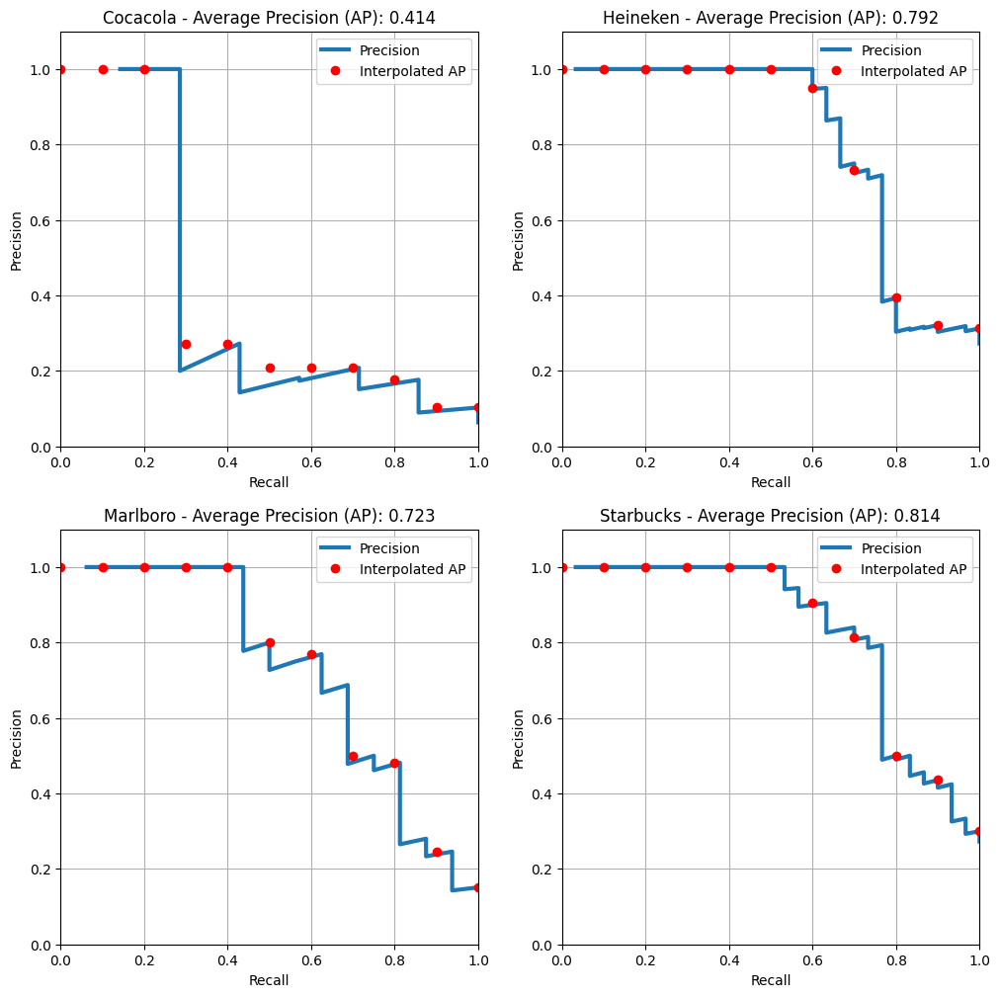

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.414
Heineken   ===>  0.792
Marlboro   ===>  0.723
Starbucks  ===>  0.814

Mean Average Precision (mAP) ===> 0.686
----------------------------------------------------------------------
Threshold: 0.67
Number of matches (Cocacola):
[ 4.  1.  0.  5.  2.  5.  2.  2.  8.  3.  1.  1.  2.  3.  2.  1.  3.  3.
 24. 30.  7.  2.  5.  5. 11.  2.  0.  2.  4.  3.  5.  0.  3.  2.  3.  3.
  1.  3.  0.  2.  4.  3.  4.  1.  1.  4.  7.  2.  2.  1.  4.  1.  1.  2.
  2.  5.  4.  3.  1.  0.  1.  2.  4.  0.  1.  1.  3.  3.  3.  2.  1.  2.
  2.  5.  2.  0.  1.  1.  1.  2.  4.  0.  0.  2.  1.  1.  0.  0.  1.  1.
  1.  3.  6.  7.  2.  4.  1.  4.  1.  0.  0.  2.  6.  0.  4.  2.  3.  0.
  2.  3.]
Number of matches (Heineken):
[  4.   0.   1.   1.   2.   0.   2.   2.   9.   1.   2.   0.   2.   0.
   0.   1.   0.   1.   0.   2.   0.   0.   1.   0.   9.  27.  21.   1.
 120.  36.   4.  29.   0.  21.   1.  25.   1.  28.  10.  20.   6.  14.
  14.   0.   0.  

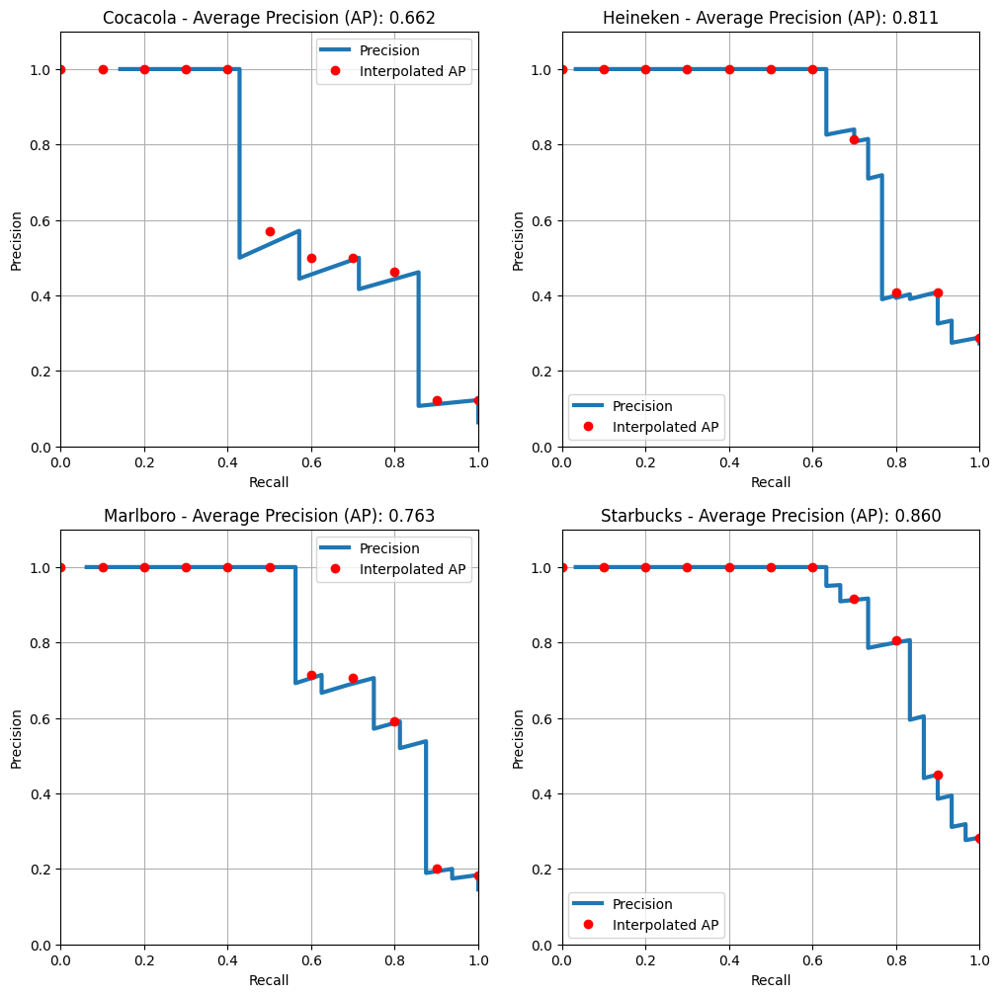

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.662
Heineken   ===>  0.811
Marlboro   ===>  0.763
Starbucks  ===>  0.860

Mean Average Precision (mAP) ===> 0.774
----------------------------------------------------------------------
Threshold: 0.72
Number of matches (Cocacola):
[ 7.  3.  1.  8.  5.  5.  3.  2. 11.  5.  4.  3.  3.  6.  6.  6.  5.  8.
 32. 35. 14.  6.  7.  6. 14.  4.  0.  3.  7.  7.  8.  1.  8.  7.  8.  3.
  3.  7.  1.  3.  8.  5.  5.  1.  2.  5. 10.  4.  4.  1.  9.  2.  3.  4.
  3.  6.  4.  6.  3.  1.  2.  3.  8.  1.  2.  5.  4.  6.  5.  3.  4.  2.
  2.  7.  6.  2.  6.  3.  4.  4.  4.  1.  3.  2.  3.  3.  1.  3.  3.  3.
  2.  6.  8. 10.  2.  6.  2.  6.  1.  3.  0.  4.  7.  0.  7.  3.  4.  5.
  5.  4.]
Number of matches (Heineken):
[ 11.   2.   1.   2.   4.   1.   2.   2.  12.   3.   3.   4.   3.   1.
   1.   3.   1.   2.   1.   2.   1.   2.   1.   4.  14.  40.  26.   9.
 150.  51.   9.  42.   2.  29.   3.  34.   3.  48.  16.  31.  12.  19.
  18.   1.   1.  

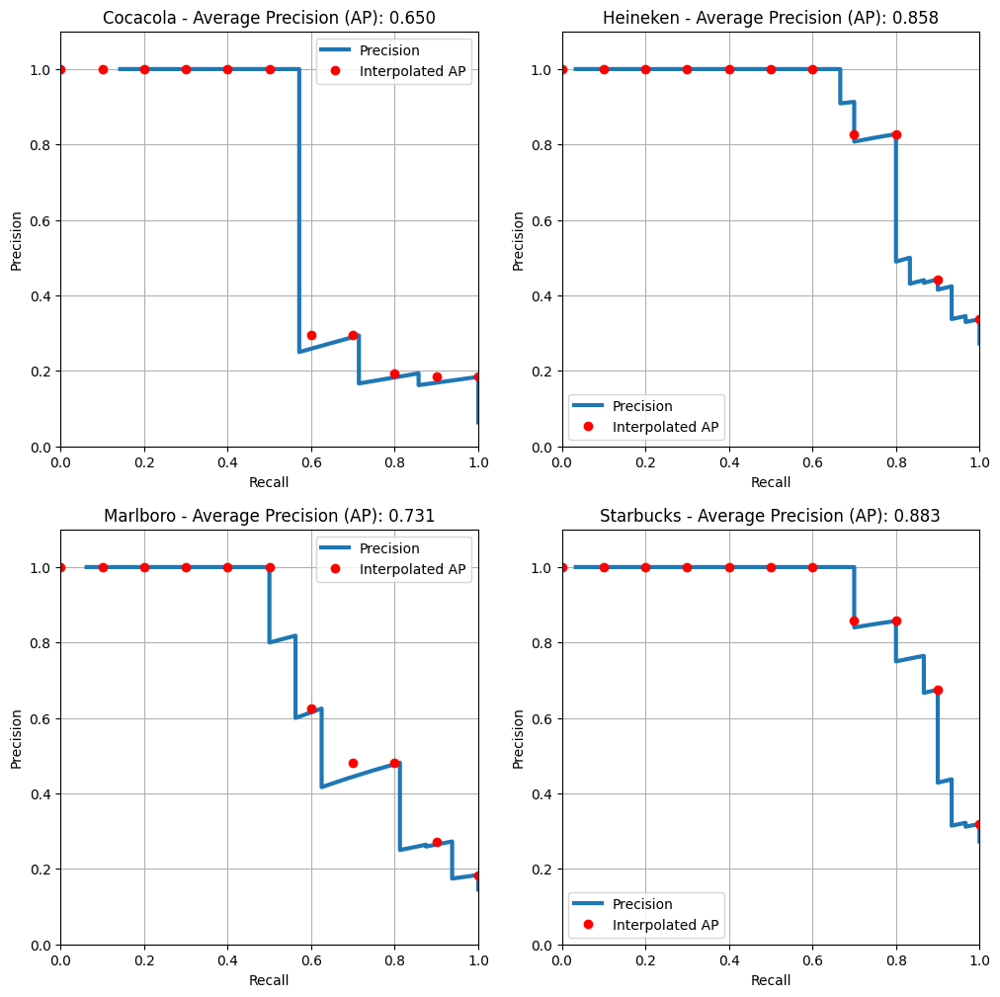

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.650
Heineken   ===>  0.858
Marlboro   ===>  0.731
Starbucks  ===>  0.883

Mean Average Precision (mAP) ===> 0.780
----------------------------------------------------------------------
Threshold: 0.78
Number of matches (Cocacola):
[16.  4.  4. 10.  7.  8.  6.  7. 15. 13.  5.  5.  6.  9.  7.  8.  7.  9.
 45. 43. 29.  9. 18. 12. 17.  8.  2.  7. 13. 16. 10.  2. 15. 10. 14. 10.
  6. 13.  4.  7. 13.  7. 10.  6.  6. 11. 17.  7.  9.  6. 15.  6.  7.  7.
 10.  9. 11. 10.  5.  7. 11.  5. 16.  4.  7. 12.  7. 12.  9.  7.  6.  6.
  8. 13. 10.  5. 12.  5.  8.  9.  6.  7.  4.  7.  7.  8.  6.  7.  4.  9.
  5.  9. 11. 14.  5.  9.  5. 14.  4.  8.  7. 11.  7.  4. 11.  8. 12. 10.
  8.  8.]
Number of matches (Heineken):
[ 22.   2.   7.   3.  11.   3.   3.   5.  18.  10.   9.   7.   6.  11.
   7.   7.   7.   6.  10.   9.  10.   6.   8.  12.  24.  57.  33.  10.
 177.  73.  16.  55.   9.  35.  12.  50.   7.  77.  27.  49.  17.  37.
  25.   6.   5.  

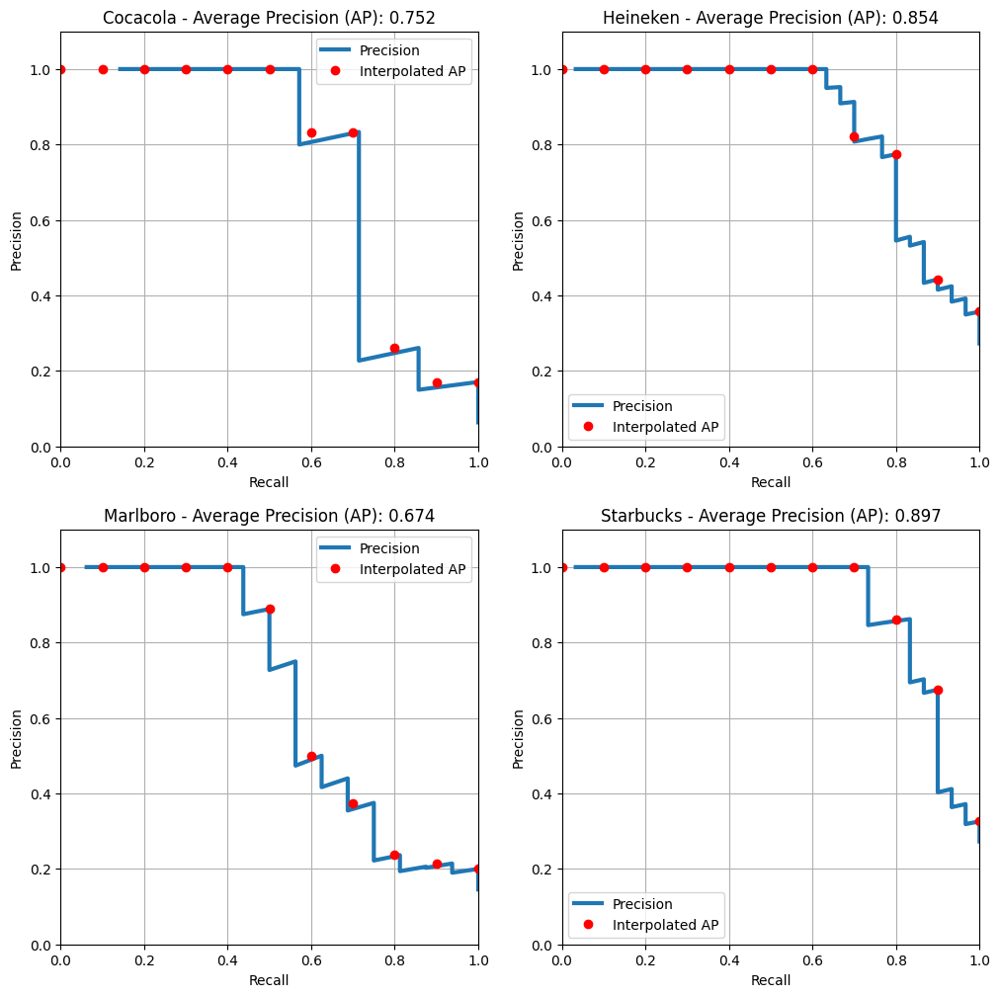

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.752
Heineken   ===>  0.854
Marlboro   ===>  0.674
Starbucks  ===>  0.897

Mean Average Precision (mAP) ===> 0.794
----------------------------------------------------------------------
Threshold: 0.83
Number of matches (Cocacola):
[29.  7. 14. 17. 19. 13. 13. 26. 25. 24. 15. 12. 12. 18. 14. 22. 18. 13.
 63. 54. 45. 19. 26. 18. 38. 21.  9. 15. 24. 25. 23. 16. 20. 26. 25. 19.
 13. 24. 14. 14. 20. 12. 21. 23. 11. 26. 24.  9. 22. 22. 24. 20. 16. 12.
 20. 15. 19. 17. 14. 18. 18. 16. 25.  8. 15. 23. 17. 21. 16. 15. 15. 13.
 16. 28. 17. 12. 22. 12. 22. 17. 16. 15.  7. 13. 16. 17. 10. 22. 17. 20.
 13. 20. 20. 23. 16. 18. 13. 21. 13. 20. 15. 27. 11. 14. 21. 19. 25. 17.
 16. 13.]
Number of matches (Heineken):
[ 40.  10.  25.   9.  23.  15.  12.  14.  37.  26.  22.  15.  16.  22.
  13.  20.  17.  15.  23.  21.  26.  20.  20.  22.  42.  79.  57.  20.
 210. 109.  30.  70.  22.  70.  27.  73.  18. 109.  40.  66.  31.  55.
  39.  19.   8. 1

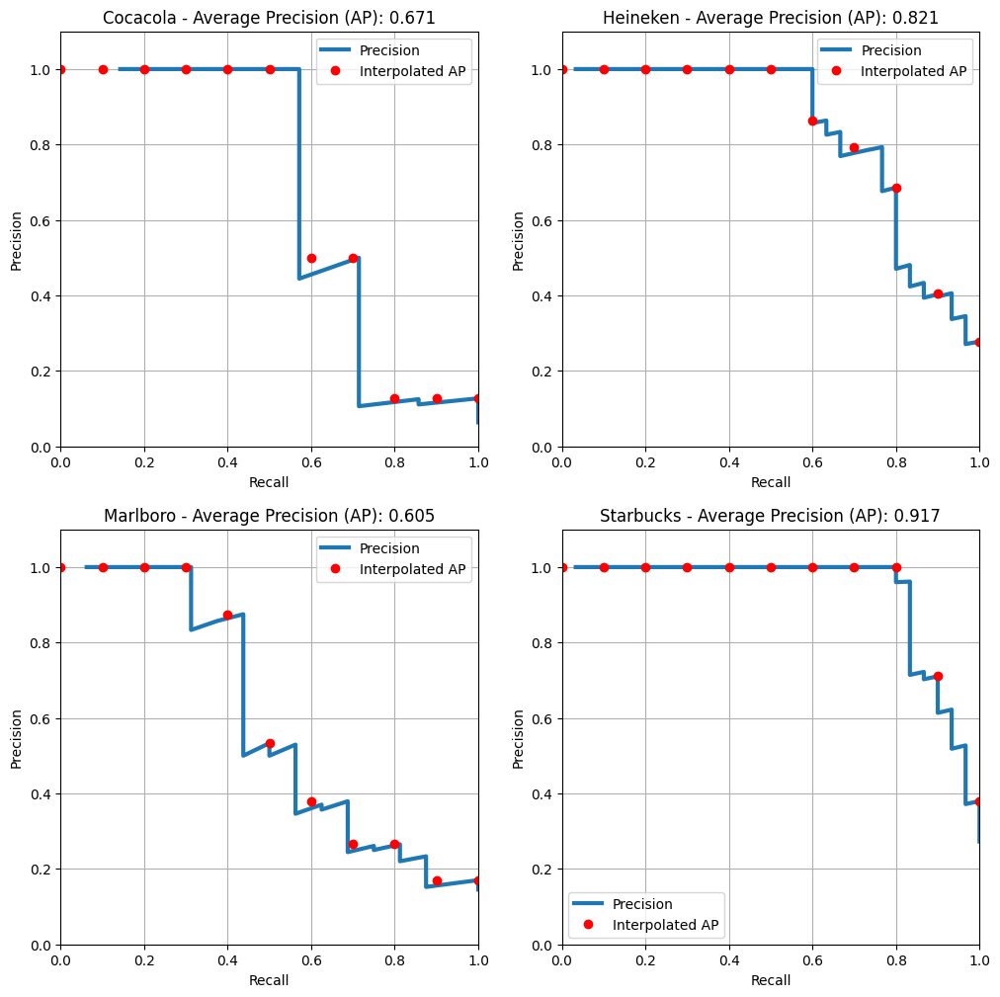

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.671
Heineken   ===>  0.821
Marlboro   ===>  0.605
Starbucks  ===>  0.917

Mean Average Precision (mAP) ===> 0.754
----------------------------------------------------------------------
Threshold: 0.89
Number of matches (Cocacola):
[50. 23. 37. 40. 42. 45. 42. 51. 57. 43. 45. 37. 34. 44. 32. 40. 47. 29.
 80. 84. 83. 51. 56. 45. 68. 56. 37. 41. 48. 48. 54. 43. 41. 51. 45. 45.
 43. 42. 39. 41. 40. 35. 42. 56. 32. 53. 47. 29. 45. 47. 54. 49. 40. 31.
 43. 38. 42. 45. 41. 49. 40. 36. 49. 30. 43. 52. 38. 40. 46. 44. 39. 37.
 43. 46. 35. 29. 49. 37. 41. 41. 44. 46. 28. 27. 46. 45. 24. 47. 40. 43.
 36. 49. 47. 49. 36. 45. 44. 40. 34. 46. 35. 42. 23. 47. 43. 39. 49. 40.
 58. 35.]
Number of matches (Heineken):
[ 74.  38.  63.  36.  55.  47.  43.  40.  72.  71.  66.  53.  49.  51.
  30.  46.  54.  42.  55.  71.  67.  71.  54.  62.  84. 114.  96.  66.
 250. 162.  64. 102.  49. 120.  64. 122.  58. 153.  75. 108.  61.  91.
  68.  43.  56. 1

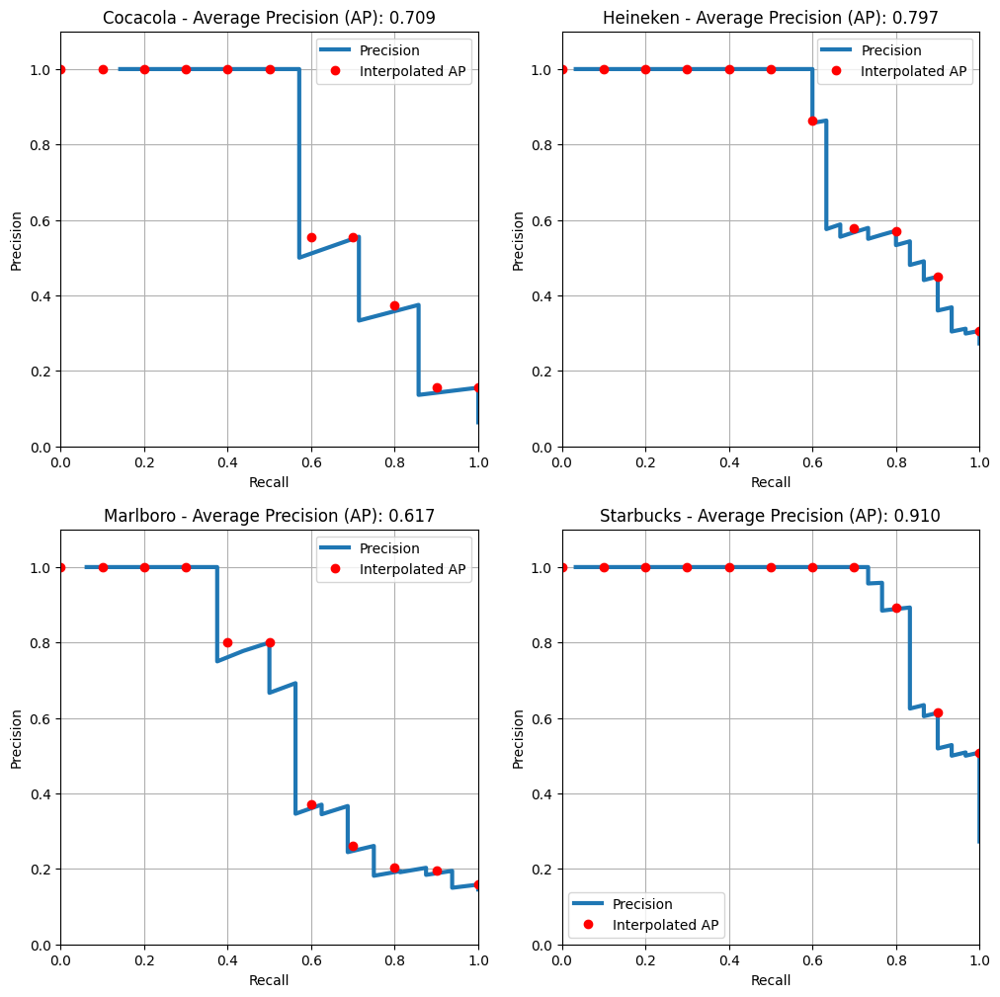

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.709
Heineken   ===>  0.797
Marlboro   ===>  0.617
Starbucks  ===>  0.910

Mean Average Precision (mAP) ===> 0.758
----------------------------------------------------------------------
Threshold: 0.94
Number of matches (Cocacola):
[107.  91. 101. 106. 111. 113.  96. 109. 112. 109. 102.  88.  83. 104.
  89. 105.  99.  82. 133. 136. 139. 122. 109.  93. 131. 106. 102. 105.
 112. 110. 113. 117. 103. 110. 104. 105. 117.  99. 115.  97. 103.  82.
 111. 113.  98. 125. 109.  72. 115.  90. 116.  95. 103. 101. 117.  91.
 114. 105.  91. 101. 106.  92.  98. 108. 109. 129. 101. 102.  95. 105.
  92. 106. 106. 123. 102.  98. 115.  99. 101. 119. 110. 112. 102.  78.
  99. 120. 102. 114. 103.  97. 114. 122. 111.  93.  90. 112. 114. 105.
 108. 110. 111.  92.  82. 106.  89. 112. 121.  99. 134.  94.]
Number of matches (Heineken):
[182. 134. 173. 141. 150. 162. 146. 126. 159. 207. 173. 148. 141. 165.
 124. 153. 163. 149. 162. 184. 177. 175. 142. 18

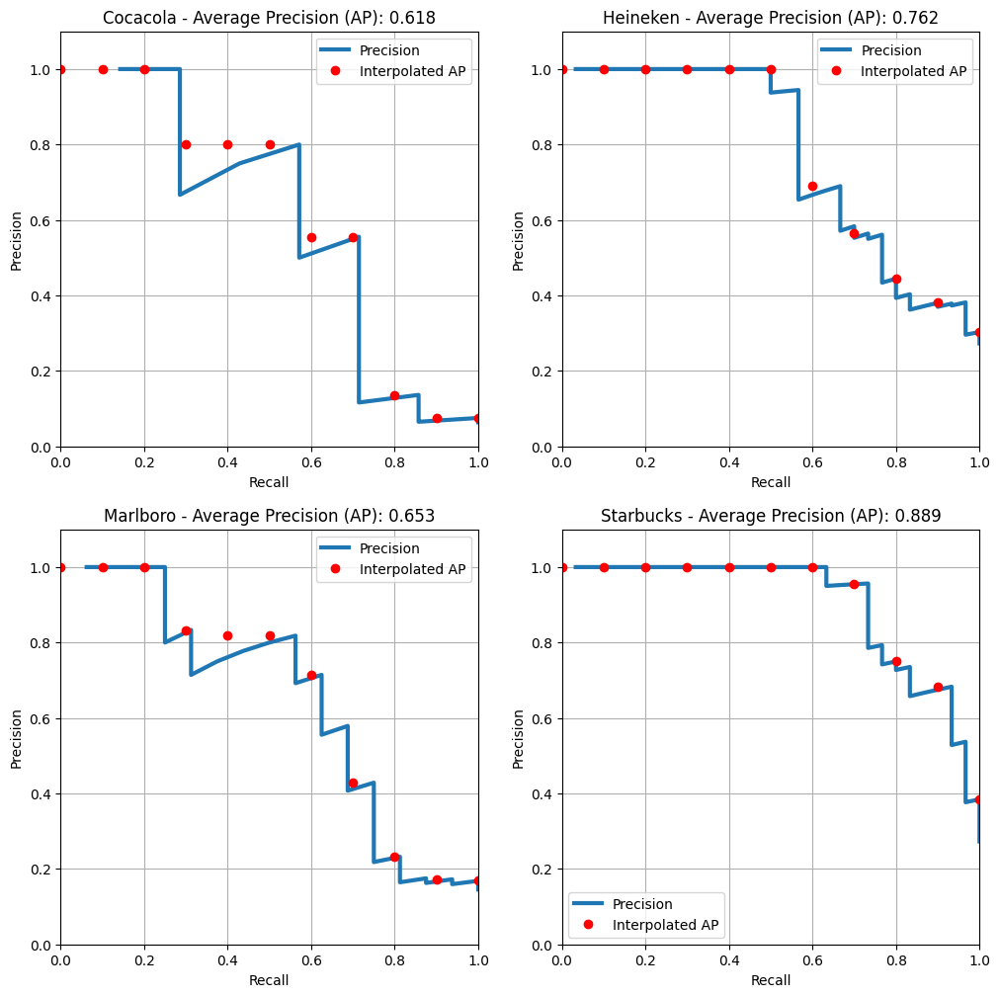

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.618
Heineken   ===>  0.762
Marlboro   ===>  0.653
Starbucks  ===>  0.889

Mean Average Precision (mAP) ===> 0.730
----------------------------------------------------------------------
Threshold: 1.00
Number of matches (Cocacola):
[274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 273.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 273.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274.
 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274. 274.]
Number of matches (Heineken):
[468. 468. 468. 468. 468. 468. 468. 468. 468. 468. 468. 468. 468. 468.
 468. 468. 468. 468. 468. 468. 468. 468. 468. 46

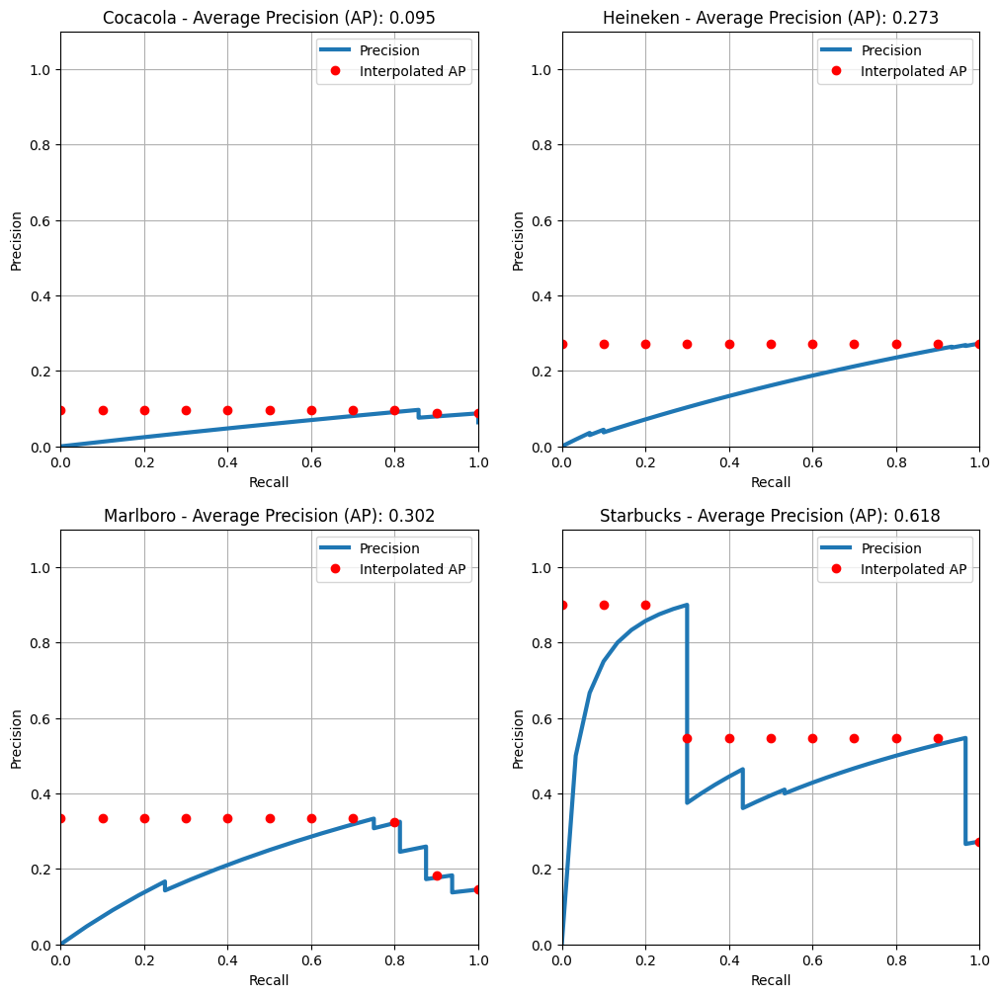

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.095
Heineken   ===>  0.273
Marlboro   ===>  0.302
Starbucks  ===>  0.618

Mean Average Precision (mAP) ===> 0.322


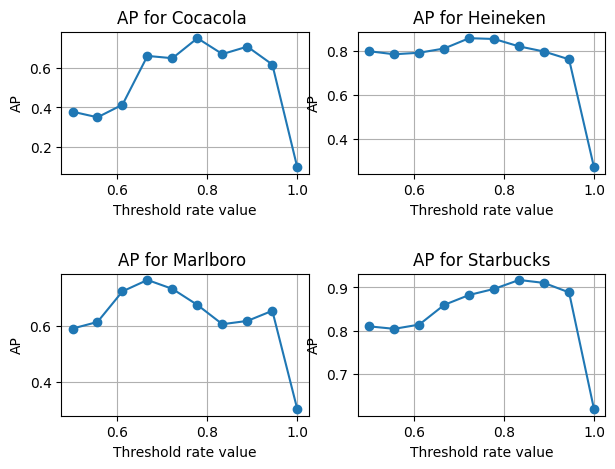

In [40]:
THRD = np.linspace(0.5, 1, num = 10) # num can be variated, it is a threshold on the rate value

all_AP = []
for i in THRD:
  print('----------------------------------------------------------------------')
  print(f'Threshold: {i:.2f}')
  logo_matches, num_matches = get_matches(ratio_thresh = i)

  AP = get_graphs(num_matches)

  all_AP.append(AP)

all_AP = np.array(all_AP)

for i in range(all_AP.shape[1]):
  plt.subplot(2, 2, i + 1)
  plt.plot(THRD, all_AP[:, i], marker = 'o', linestyle = '-')
  plt.title(f'AP for {logo_names[i]:9s}')
  plt.xlabel('Threshold rate value')
  plt.ylabel('AP')
  plt.grid()

plt.show()
